### What is Chroma ###

It is really important to define the context of a chord recognition system if we want a computer to extract meaningful segmentations of pitch. We need to define a pitch-system and can use that information to help extract the notes.

(It is possible to determine the 'average' key of a piece, but I wonder what it would make of the opening of Beethoven 1!).

Ideally, such a system should ignore timbre and instrumentation and focus only on pitch and harmonic elements. Typically, the 12-tone system is used, although with Georgian music, we have something potentially more complex.

Octaves represent a change in color, while pitch change represents a change in chroma (note that for this purpose, C# and Db are the same, even though every musician knows they are not!).


### Computer Analysis ###

If we compute the STFT of the audio signal and then use various binning strategies (pre-processing that reduces errors) then Librosa lets use play around with chroma analysis.

In [6]:
# Listen to song

%matplotlib inline
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display

x, sr = librosa.load('01 Mravalzhamier - Table Song, Kakheti.wav')
ipd.Audio(x, rate=sr)

/usr/local/lib/python3.5/dist-packages/scipy/sparse/lil.py:512: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not i.flags.writeable or i.dtype not in (np.int32, np.int64):
/usr/local/lib/python3.5/dist-packages/scipy/sparse/lil.py:514: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not j.flags.writeable or j.dtype not in (np.int32, np.int64):


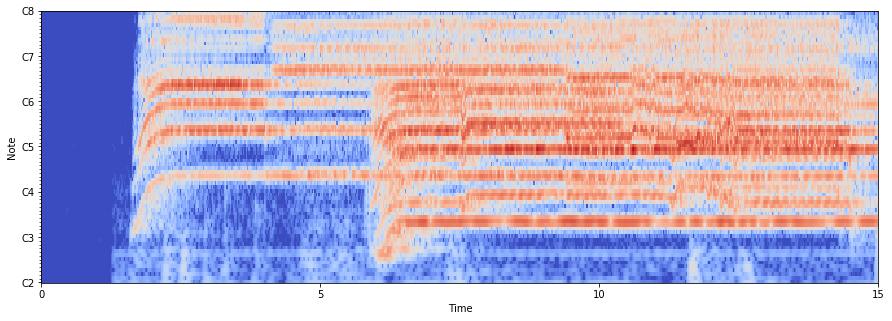

In [13]:
%matplotlib inline
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display

x, sr = librosa.load('01 Mravalzhamier - Table Song, Kakheti.wav', offset=0, duration=15)
ipd.Audio(x, rate=sr)

# compute a constant-Q spectrogram
# The transform exhibits a reduction in frequency resolution with higher frequency bins,
# which is desirable for auditory applications. The transform mirrors the human auditory system
# whereby at lower-frequencies spectral resolution is better, whereas temporal resolution improves at
# higher frequencies

fmin = librosa.midi_to_hz(36)
hop_length = 512
C = librosa.cqt(x, sr=sr, fmin=fmin, n_bins=72, hop_length=hop_length)

# display 10 second segment from beginning

logC = librosa.amplitude_to_db(numpy.abs(C))
plt.figure(figsize=(15, 5))
librosa.display.specshow(logC, sr=sr, x_axis='time', y_axis='cqt_note', fmin=fmin, cmap='coolwarm')

#### Chroma Vector ####

/usr/local/lib/python3.5/dist-packages/scipy/sparse/lil.py:512: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not i.flags.writeable or i.dtype not in (np.int32, np.int64):
/usr/local/lib/python3.5/dist-packages/scipy/sparse/lil.py:514: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not j.flags.writeable or j.dtype not in (np.int32, np.int64):


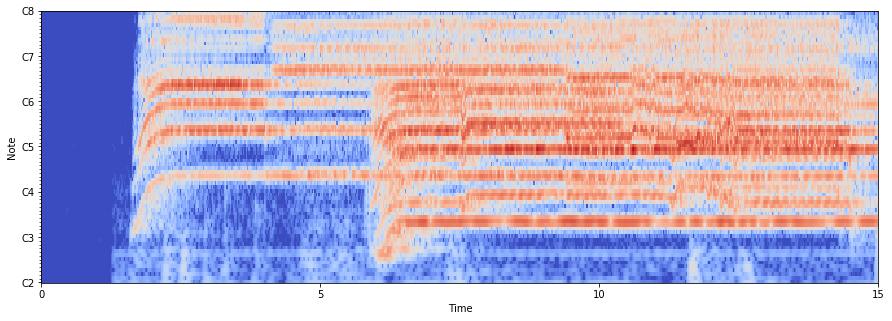

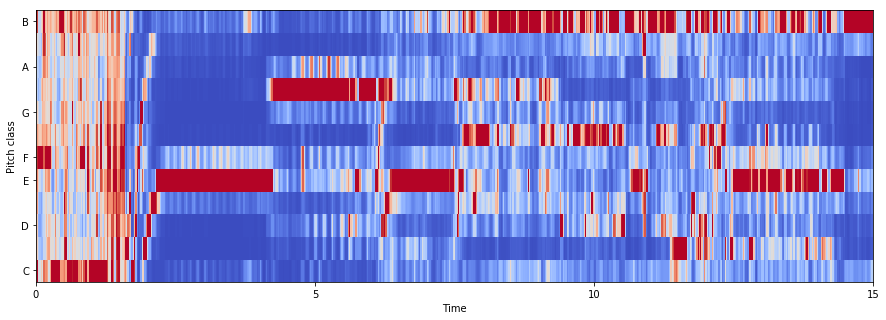

In [14]:
%matplotlib inline
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display

x, sr = librosa.load('01 Mravalzhamier - Table Song, Kakheti.wav', offset=0, duration=15)
ipd.Audio(x, rate=sr)

# compute a constant-Q spectrogram
# The transform exhibits a reduction in frequency resolution with higher frequency bins,
# which is desirable for auditory applications. The transform mirrors the human auditory system
# whereby at lower-frequencies spectral resolution is better, whereas temporal resolution improves at
# higher frequencies

fmin = librosa.midi_to_hz(36)
hop_length = 512
C = librosa.cqt(x, sr=sr, fmin=fmin, n_bins=72, hop_length=hop_length)

# display 10 second segment from beginning

logC = librosa.amplitude_to_db(numpy.abs(C))
plt.figure(figsize=(15, 5))
librosa.display.specshow(logC, sr=sr, x_axis='time', y_axis='cqt_note', fmin=fmin, cmap='coolwarm')

# how much energy of each pitch class, {C, C#, D, D#, E, ..., B}, is present in the signal

chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

#### Chroma CQT ####

/usr/local/lib/python3.5/dist-packages/scipy/sparse/lil.py:512: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not i.flags.writeable or i.dtype not in (np.int32, np.int64):
/usr/local/lib/python3.5/dist-packages/scipy/sparse/lil.py:514: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not j.flags.writeable or j.dtype not in (np.int32, np.int64):


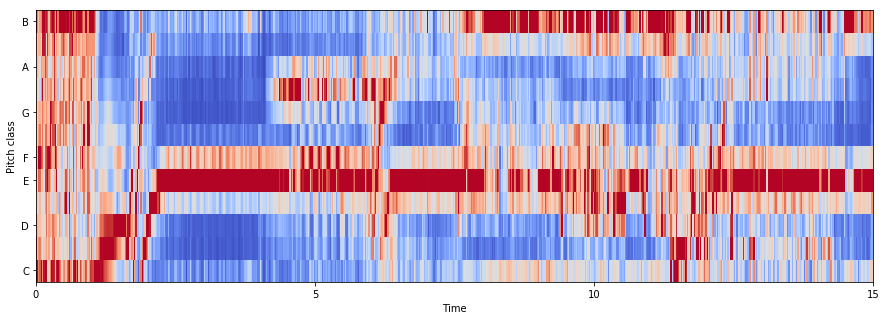

In [15]:
%matplotlib inline
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display

x, sr = librosa.load('01 Mravalzhamier - Table Song, Kakheti.wav', offset=0, duration=15)
ipd.Audio(x, rate=sr)

fmin = librosa.midi_to_hz(36)
hop_length = 512
C = librosa.cqt(x, sr=sr, fmin=fmin, n_bins=72, hop_length=hop_length)

chromagram = librosa.feature.chroma_cqt(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

#### Final Example ####

The final example of this excerpt uses CENS, which I read is a feature that takes statistics over large windows to smooth local deviations in tempo, articulation, and musical ornaments such as trills and arpeggiated chords.

/usr/local/lib/python3.5/dist-packages/scipy/sparse/lil.py:512: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not i.flags.writeable or i.dtype not in (np.int32, np.int64):
/usr/local/lib/python3.5/dist-packages/scipy/sparse/lil.py:514: FutureWarning: future versions will not create a writeable array from broadcast_array. Set the writable flag explicitly to avoid this warning.
  if not j.flags.writeable or j.dtype not in (np.int32, np.int64):


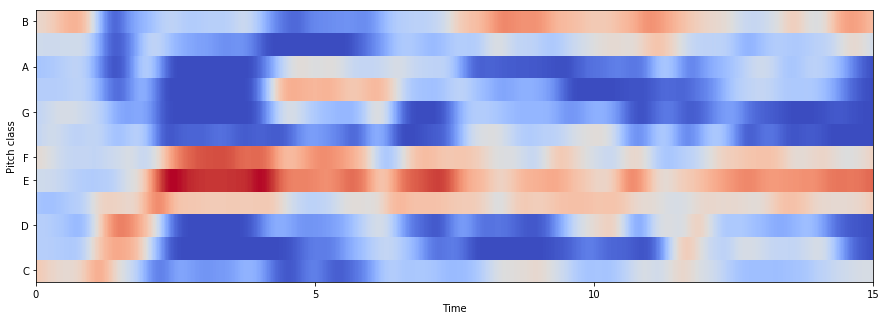

In [16]:
%matplotlib inline
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display

x, sr = librosa.load('01 Mravalzhamier - Table Song, Kakheti.wav', offset=0, duration=15)
ipd.Audio(x, rate=sr)

fmin = librosa.midi_to_hz(36)
hop_length = 512
C = librosa.cqt(x, sr=sr, fmin=fmin, n_bins=72, hop_length=hop_length)

chromagram = librosa.feature.chroma_cens(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')